# Classifying images with GoogleNet/Inception and ResNet models

In computer vision, a  classification task is the estimation of the probability that an input image belongs to a particular category. In other words, the algorithm must determine the category for the image and the main goal is to create a classifier with the lowest number of errors. Classification tasks first gave deep learning algorithms an edge over other algorithms. Since then, Deep Learning has gained huge interest from many scientists and engineers. In this recipe, we will apply three models with different architectures to the classification task.

Neural network models for classification usually accept three-channel images and produce a vector with probabilities across categories. To use a trained model, you need to know a few things:

* What preprocessing of input images has been used in training 
* Which layers are inputs and which are outputs 
* How data is organized in the output tensor 
* What meaning the values in the output tensor have

In our case, each model requires its own preprocessing. Also, models need different orders of channels. Without these two things, models won't work as well (sometimes slightly, sometimes dramatically). Also, models have different names for input and output layers.

Output vectors in classification contain probabilities for all categories. Indexes for maximal values in the outputs are indexes for categories. To convert such indexes to names, you need to parse a special file with matches between categories indexes and their names. These files may be (and in our case are) different for different models.


In [1]:
# Import all of the necessary modules
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

%matplotlib auto
%pylab inline


def print_image(header,name,np_arr,start_First=0, end_First=1, start_Second=0, end_Second=2,start_3=0, end_3=5):
    print("------  {0:-<25}    Shape{1} {2}: {3:}".format(header, np_arr.shape, name, str(np_arr.dtype)) )
    shapes = np_arr.shape #print(shapes)
    if shapes[0] < end_First:
        end_First = shapes[0]
    if shapes[1] < end_Second:
        end_Second = shapes[1]
    if len(shapes)==3:
        if shapes[2] < end_3:
            end_3 = shapes[2]
    if len(shapes)==3:
        for i in range (start_First,end_First):
            print("[", sep='',end="")
            for j in range (start_Second,end_Second):
                print(np_arr[i,j,start_3:end_3], sep=' ', end=" ")
            print(']')
    if len(shapes)==2:
        for i in range (start_First,end_First):
            print("[", end=" ")
            #print(np_arr[i,start_Second:end_Second],sep=' ',end=" ") cutoff sting by<60
            for k in range (start_Second,end_Second):
                print(np_arr[i,k], end=" ")
            print(']')
def plt_view_image(plt,list_images,figsize=(15,6), axis="off", cmap='gray'):
    #%pylab inline
    plt.figure(figsize=figsize)
    n = len(list_images)  #; print(n)
    plot_number = 1
    for name, img in list_images:
        plt.subplot(1,n,plot_number)
        plt.axis(axis)
        plt.title(name)
        if cmap =='gray':
            plt.imshow(img,cmap='gray' )
        else:
            plt.imshow(img )
        plot_number = plot_number + 1
    plt.show()
#help("modules")   
import sys             
print('\n'.join(sys.path))
print("current folder ==",os.getcwd())
#pip list"

Using matplotlib backend: TkAgg
Populating the interactive namespace from numpy and matplotlib
D:\HTML_DOC\Program\opencv\Packt\S05\env
C:\Program Files\Python38\python38.zip
C:\Program Files\Python38\DLLs
C:\Program Files\Python38\lib
C:\Program Files\Python38
d:\html_doc\program\opencv\packt\s05\env

d:\html_doc\program\opencv\packt\s05\env\lib\site-packages
d:\html_doc\program\opencv\packt\s05\env\lib\site-packages\pip-20.0.2-py3.8.egg
d:\html_doc\program\opencv\packt\s05\env\lib\site-packages\win32
d:\html_doc\program\opencv\packt\s05\env\lib\site-packages\win32\lib
d:\html_doc\program\opencv\packt\s05\env\lib\site-packages\Pythonwin
d:\html_doc\program\opencv\packt\s05\env\lib\site-packages\IPython\extensions
C:\Users\polit\.ipython
current folder == D:\HTML_DOC\Program\opencv\Packt\S05\env


In [2]:
def classify(video_src, net, in_layer, out_layer, mean_val, category_names, 
             image_frames, swap_channels=False):
    cap = cv2.VideoCapture(video_src)
    
    count = 0
    t = 0
    while True:
        status_cap, frame = cap.read()
        if not status_cap:
            break

        if isinstance(mean_val, np.ndarray):
            tensor = cv2.dnn.blobFromImage(frame,1.0,(224,224),1.0,False);
            tensor -= mean_val
        else:
            tensor = cv2.dnn.blobFromImage(frame,1.0,(224, 224),mean_val,swap_channels);
        net.setInput(tensor, in_layer);
        prob = net.forward(out_layer);
        prob = prob.flatten()

        r = 12
        for i in np.argsort(prob)[-5:]:
            txt = '"%s"; probability: %.2f' % (category_names[i], prob[i])
            cv2.putText(frame,txt,(0,frame.shape[0] -r*60),cv2.FONT_HERSHEY_SIMPLEX,2,(255,255,255),3);
            #cv2.putText(frame,txt,(0,0),cv2.FONT_HERSHEY_SIMPLEX,1,(0,255,0),2);
            r += 1
        count += 1
        if count % 200 == 0 or count ==1:
            image_frames.append(["frame:{0}".format(count),frame[:,:,[2,1,0]]])
        cv2.imshow('classification', frame)
        if cv2.waitKey(1) == 27:
            break
        
    cv2.destroyAllWindows()
    cap.release()

In [3]:
with open('../data/synset_words.txt') as f:
    class_names = [' '.join(l.split(' ')[1: ]).rstrip() for l in f.readlines()]
    

#############################################
print(len(class_names),"\n",class_names[:10])
filt = filter(lambda item: "space" in item , class_names)
for item in filt:    print(item)
filt = filter(lambda item: "shuttle" in item , class_names)
for item in filt:    print(item)

1000 
 ['tench, Tinca tinca', 'goldfish, Carassius auratus', 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 'tiger shark, Galeocerdo cuvieri', 'hammerhead, hammerhead shark', 'electric ray, crampfish, numbfish, torpedo', 'stingray', 'cock', 'hen', 'ostrich, Struthio camelus']
space bar
space heater
space shuttle
space shuttle


In [4]:
capture = cv2.VideoCapture('../data/shuttle.mp4')
print(capture.isOpened())
print('Created capture:', '../data/shuttle.mp4')
print('Frame count:', int(capture.get(cv2.CAP_PROP_FRAME_COUNT)))
print('Frame width:', int(capture.get(cv2.CAP_PROP_FRAME_WIDTH)))
print('Frame height:', int(capture.get(cv2.CAP_PROP_FRAME_HEIGHT)))
print('Frame rate:', capture.get(cv2.CAP_PROP_FPS))
capture.release()
print(capture.isOpened())

True
Created capture: ../data/shuttle.mp4
Frame count: 1017
Frame width: 1920
Frame height: 1080
Frame rate: 30.0
False


len(bvlc_googlenet.caffemodel) == 6


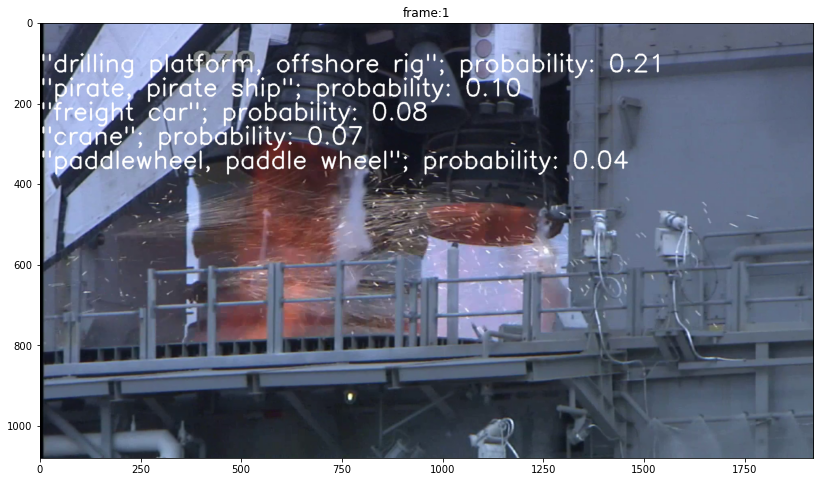

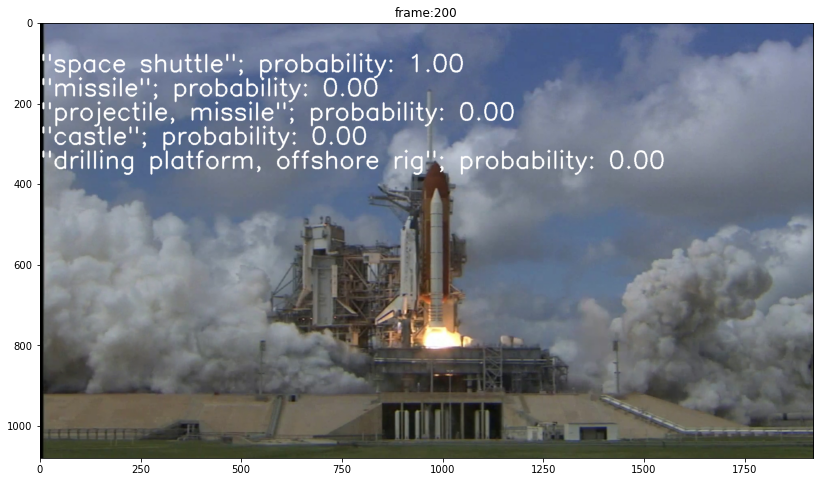

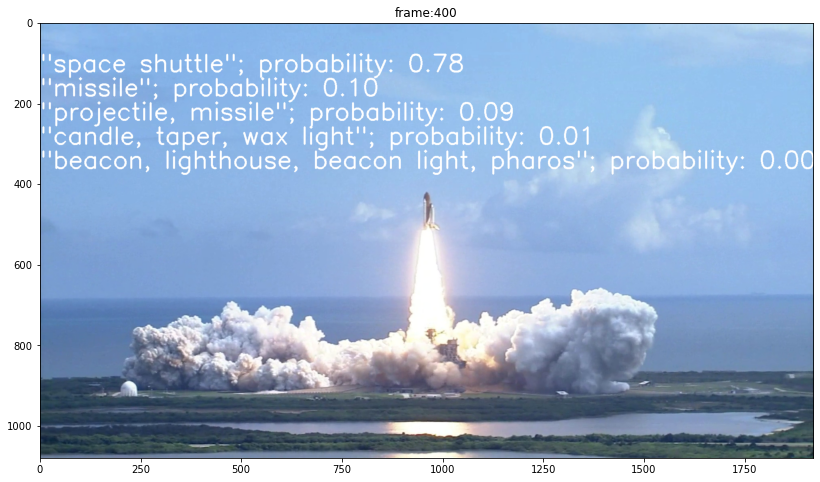

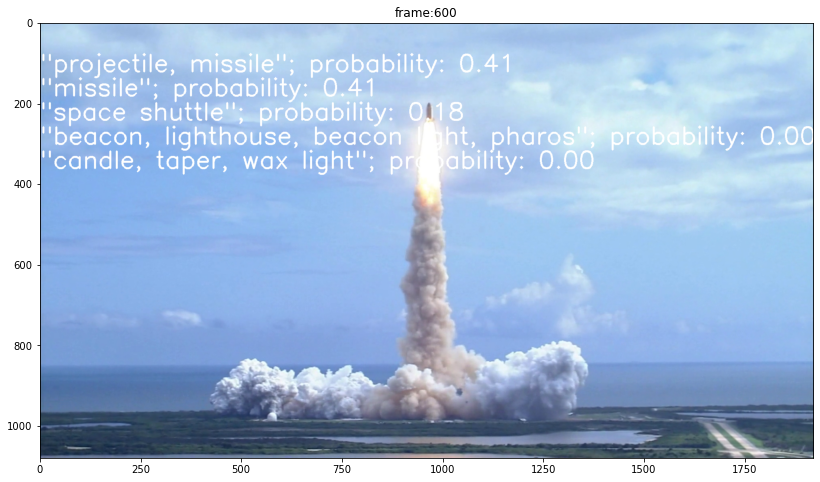

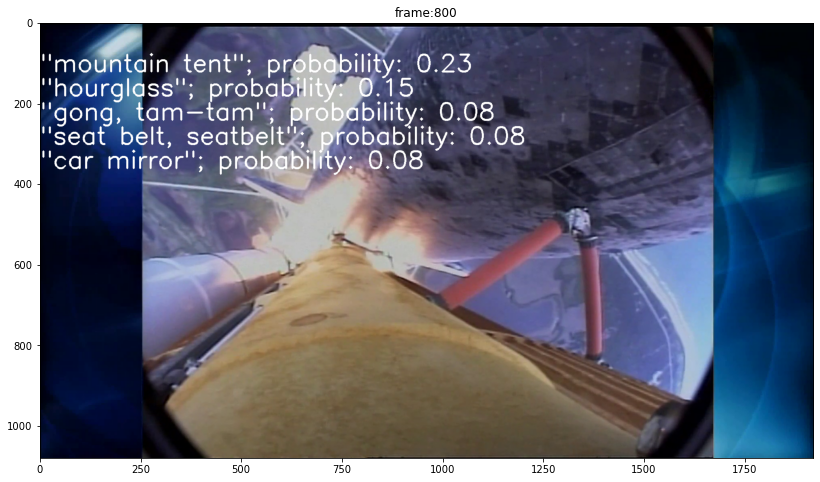

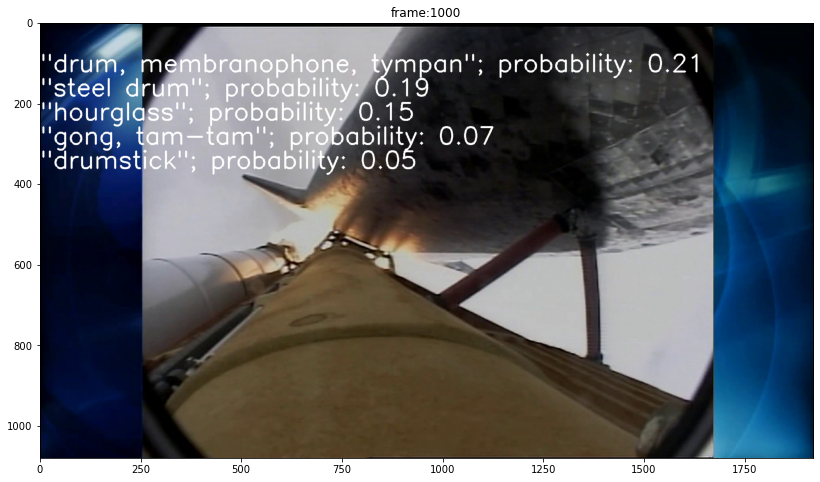

In [5]:
googlenet_caffe = cv2.dnn.readNetFromCaffe('../data/bvlc_googlenet.prototxt', 
                                           '../data/bvlc_googlenet.caffemodel')


image_frames_googlenet = []
classify('../data/shuttle.mp4', googlenet_caffe,'data','prob',(104,117,123), class_names,
         image_frames_googlenet)


#########################################################
print("len(bvlc_googlenet.caffemodel) ==", len(image_frames_googlenet))
k =1
for i in range(0,len(image_frames_googlenet),k):
    plt_view_image(plt,image_frames_googlenet[i:i+k], figsize=(15,8), axis='on', cmap='gray')

len(resnet_50.caffemodel) == 6


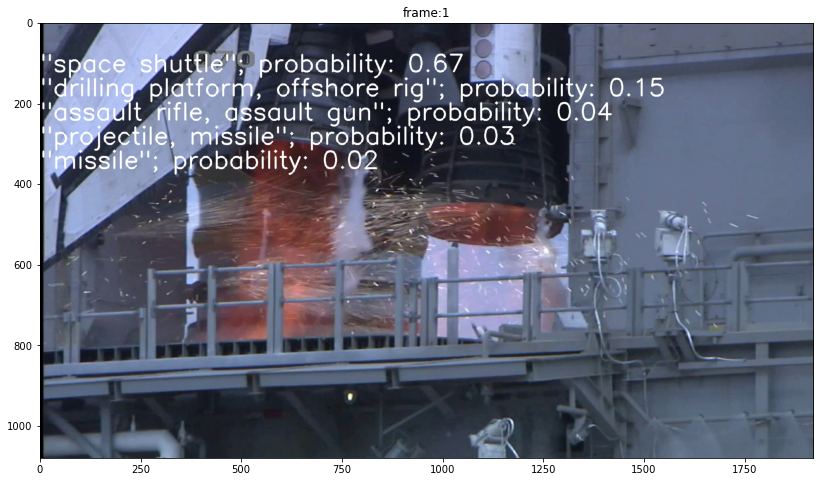

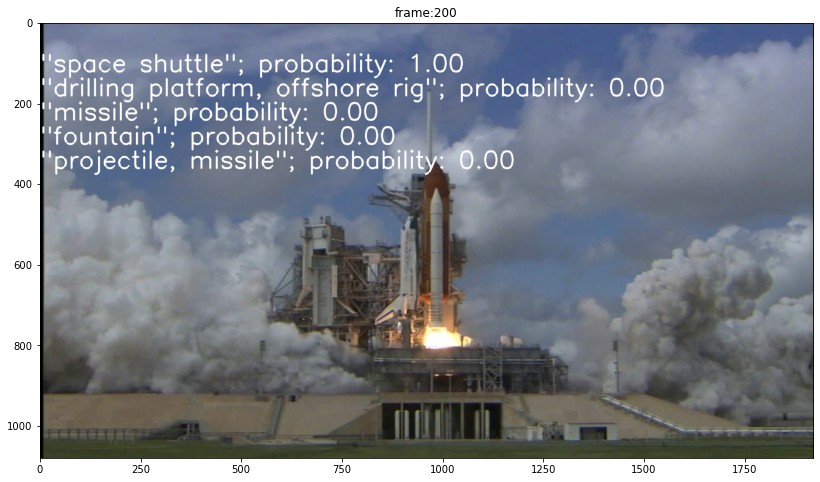

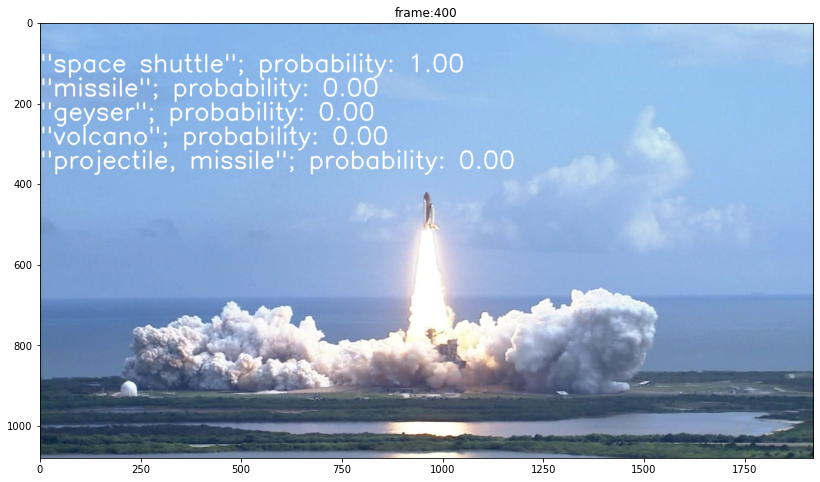

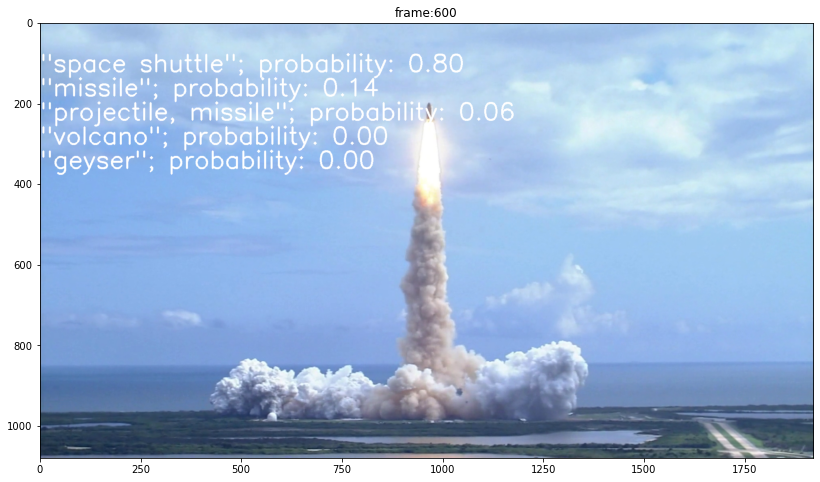

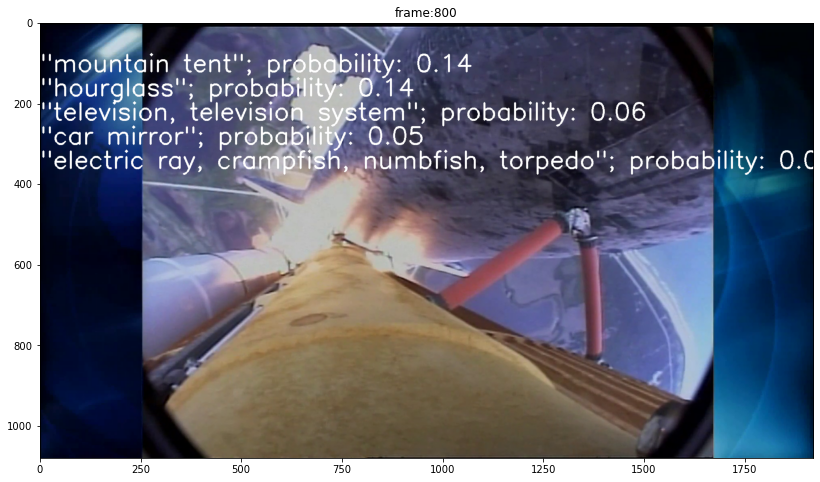

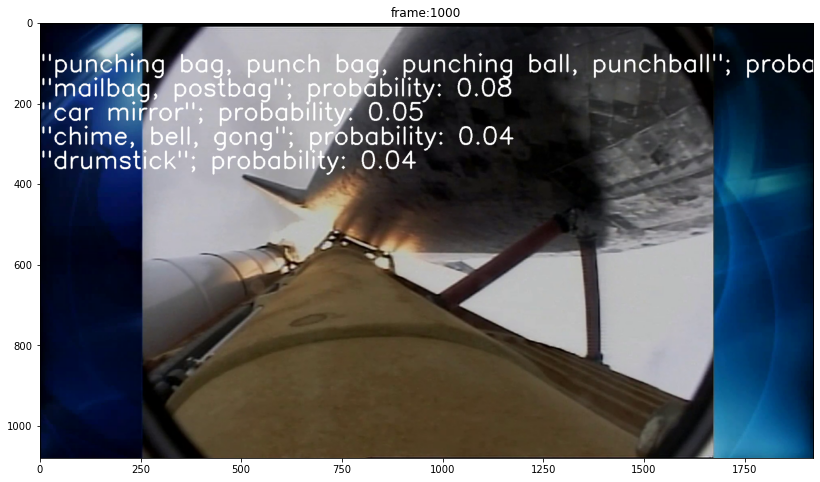

In [6]:
resnet_caffe = cv2.dnn.readNetFromCaffe('../data/resnet_50.prototxt', 
                                        '../data/resnet_50.caffemodel')
mean = np.load('../data/resnet_50_mean.npy')



image_frames_resnet_50 = []
classify('../data/shuttle.mp4', resnet_caffe, 'data', 'prob', mean, class_names, 
         image_frames_resnet_50)


#########################################################
print("len(resnet_50.caffemodel) ==", len(image_frames_resnet_50))
k =1
for i in range(0,len(image_frames_resnet_50),k):
    plt_view_image(plt,image_frames_resnet_50[i:i+k], figsize=(15,8), axis='on', cmap='gray')

In [7]:
with open('../data/imagenet_comp_graph_label_strings.txt') as f: 
    class_names = [l.rstrip() for l in f.readlines()]



#############################################
print(len(class_names),"\n",class_names[:10])
filt = filter(lambda item: "space" in item , class_names)
for item in filt:    print(item)
filt = filter(lambda item: "shuttle" in item , class_names)
for item in filt:    print(item)    

1001 
 ['dummy', 'kit fox', 'English setter', 'Siberian husky', 'Australian terrier', 'English springer', 'grey whale', 'lesser panda', 'Egyptian cat', 'ibex']
space shuttle
space heater
space bar
space shuttle


len(tensorflow_inception_graph.pb) == 6


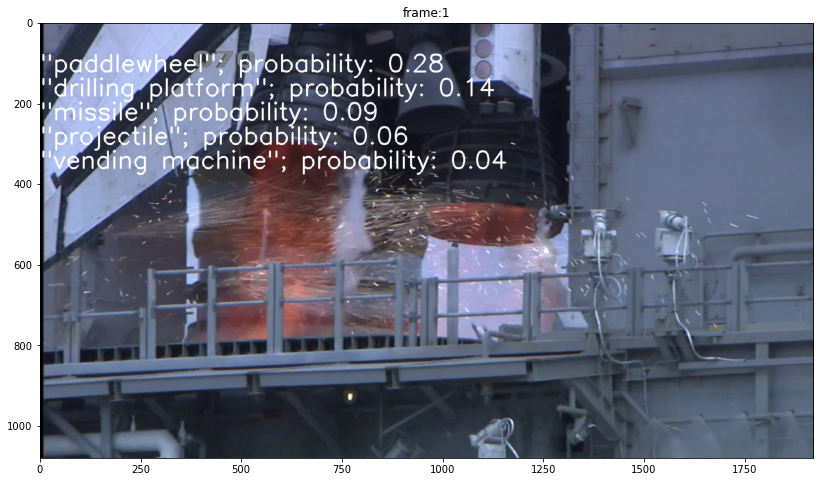

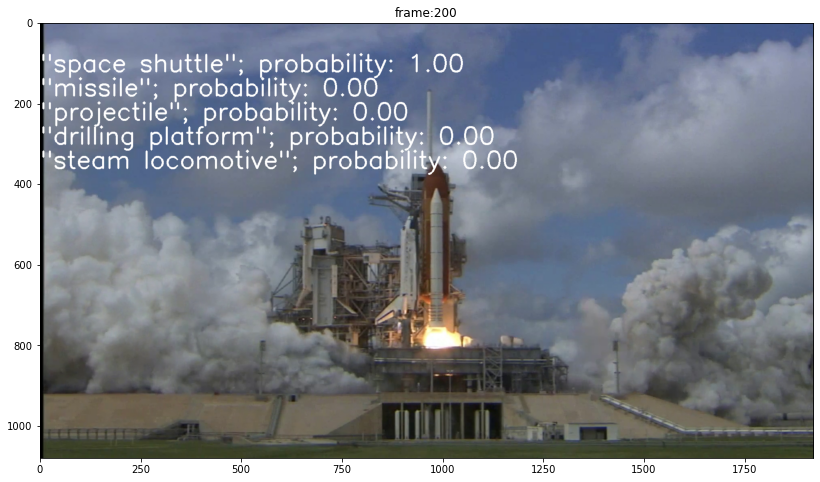

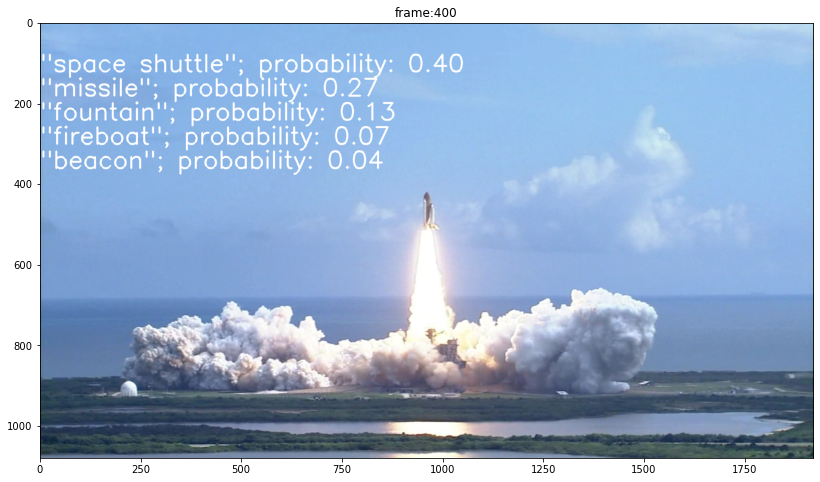

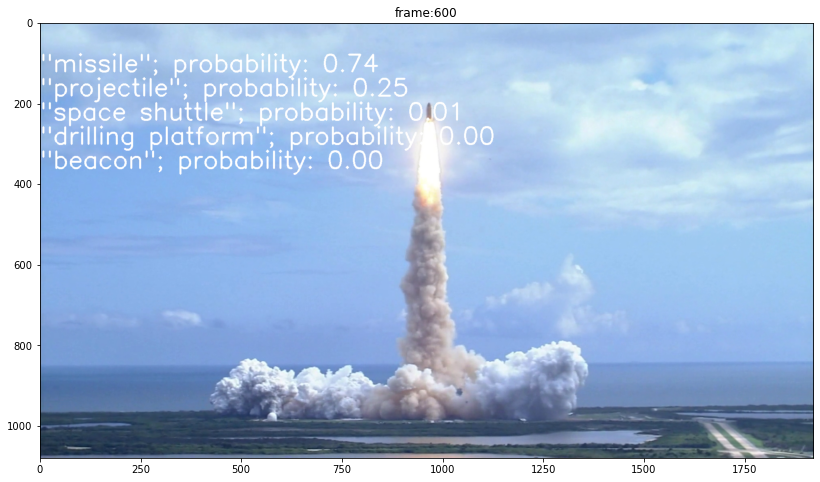

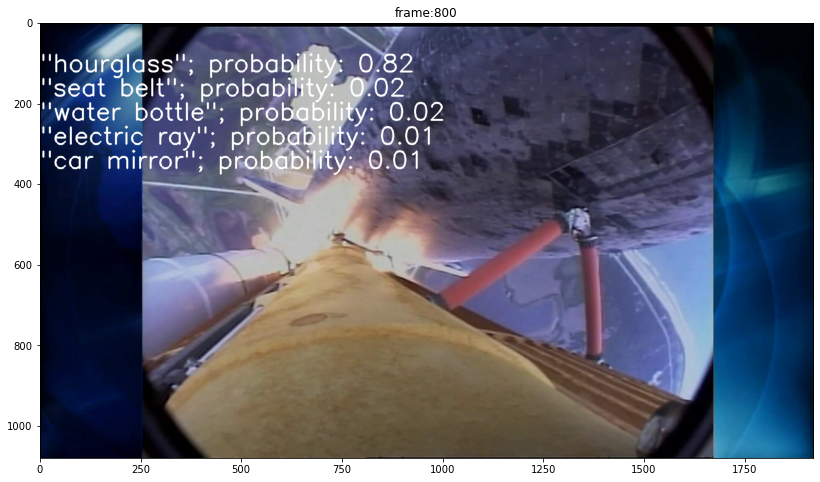

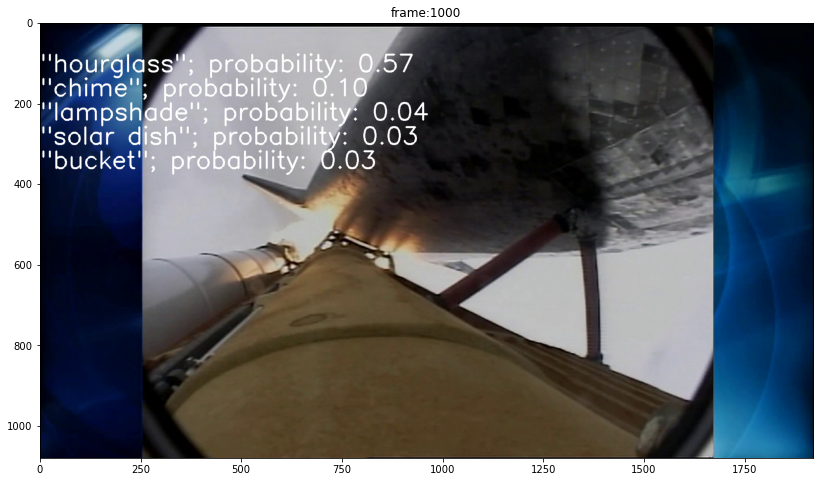

In [8]:
googlenet_tf = cv2.dnn.readNetFromTensorflow('../data/tensorflow_inception_graph.pb')


image_frames_Tensorflow = []
classify('../data/shuttle.mp4', googlenet_tf, 'input','softmax2',117,class_names,
         image_frames_Tensorflow,True)



#########################################################
print("len(tensorflow_inception_graph.pb) ==", len(image_frames_Tensorflow))
k =1
for i in range(0,len(image_frames_Tensorflow),k):
    plt_view_image(plt,image_frames_Tensorflow[i:i+k], figsize=(15,8), axis='on', cmap='gray')

0


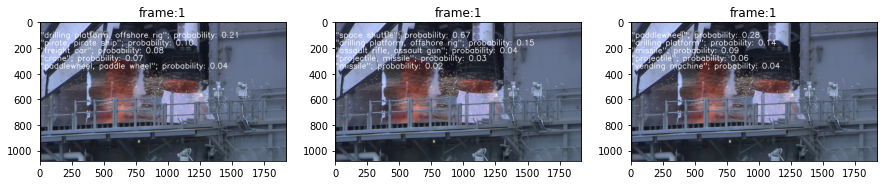

1


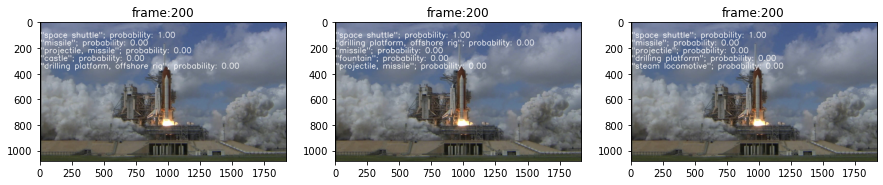

2


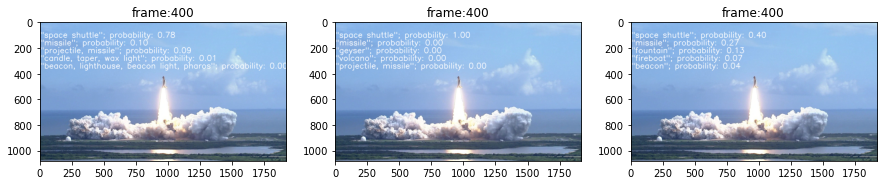

3


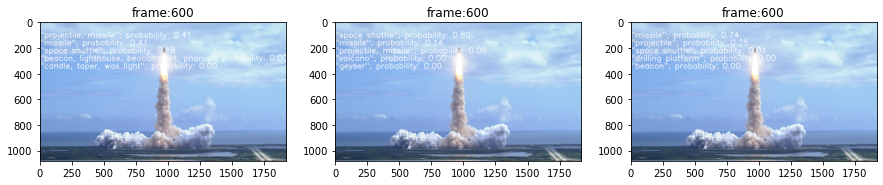

4


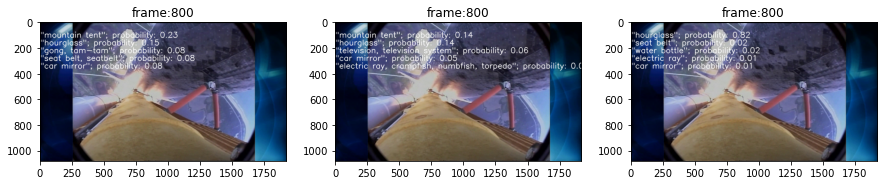

5


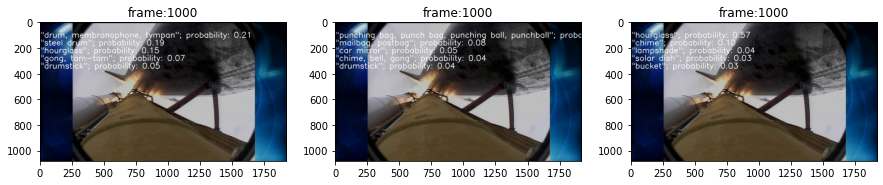

In [10]:
k =3
for i in range(0,len(image_frames_googlenet)):
    print(i)
    plt_view_image(plt,[image_frames_googlenet[i],
                        image_frames_resnet_50[i],
                        image_frames_Tensorflow[i]
                       ],
                   figsize=(15,8), axis='on', cmap='gray')